# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

In [133]:
pip install category_encoders

  Obtaining dependency information for category_encoders from https://files.pythonhosted.org/packages/7f/e5/79a62e5c9c9ddbfa9ff5222240d408c1eeea4e38741a0dc8343edc7ef1ec/category_encoders-2.6.3-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, LinearRegression, Ridge, Lasso
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SequentialFeatureSelector, RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

from category_encoders import TargetEncoder

import seaborn as sns
import plotly.express as px

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re

import warnings
warnings.filterwarnings("ignore")

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

###  Background:
According to recent data from the Bureau of Labor Statistics (BLS), vehicle transaction prices-the price you end up paying after any dealer discounts or surcharges-have risen higher and faster since 2020 than at any time in more than 35 years.

#### Business Objectives
Due to the difficulty of the last few years and the drop in sales of used vehicles, we seek to use the information collected to predict which are the best characteristics of used vehicles and with this data to improve the stock.

####  Business Success Criteria
* Provide relevant information for future sales
* Stock improvement based on forecasting.
* Improve sales campaigns


### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

### Collect Initial Data
this data is provide by clients 426K

In [2]:
pd.set_option("display.max_columns", None)
df = pd.read_csv("data/vehicles.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

### Describe Data
We find in the information provided identification data of the different vehicles, with their respective most relevant and grouping characteristics.
* id: unique identifier
* region: place of sale
* price: sales value
* year: year of construction
* manufacturer: vehicle manufacturer
* model: model of the vehicle
* condition: known condition
* cylinders: cylinder capacity 
* fuel: type of fuel
* odometer: mileage
* title_status: not described
* transmission: transmission type
* VIN: engine identification
* drive: drive type
* size: size
* type: type category
* paint_color: Vehicle color
* state: State


In [3]:
df.head(10)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
5,7222379453,hudson valley,1600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
6,7221952215,hudson valley,1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
7,7220195662,hudson valley,15995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ny
8,7209064557,medford-ashland,5000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,or
9,7219485069,erie,3000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pa


In [4]:
# function to paint properties with nulls
def print_nulls_columns(data):
    df_nulls = data.isna().sum().sort_values(ascending=False).reset_index()
    df_nulls.columns = ['Name', 'Count']
    df_nulls.plot(kind='bar', x='Name', y='Count')
    plt.title('Columns With Nulls')
    plt.grid()
    plt.show()

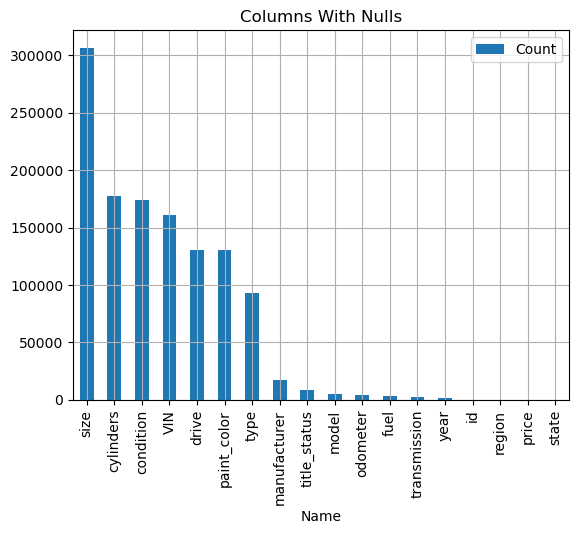

In [5]:
print_nulls_columns(df)

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [6]:
# Columns that we consider to have characteristics that may influence the analysis are eliminated.
clean_df = df
clean_df.dropna(subset=["odometer","fuel","transmission","year", "id", "region", "price", "manufacturer"], inplace=True)

# The mode of the records is used to fill in the empty data.
clean_df["size"].fillna(clean_df["size"].mode().to_string(), inplace=True)
clean_df["cylinders"].fillna(clean_df["cylinders"].mode().to_string(), inplace=True)
clean_df["condition"].fillna(clean_df["condition"].mode().to_string(), inplace=True)
clean_df["VIN"].fillna(clean_df["VIN"].mode().to_string(), inplace=True)
clean_df["drive"].fillna(clean_df["drive"].mode().to_string(), inplace=True)
clean_df["paint_color"].fillna(clean_df["paint_color"].mode().to_string(), inplace=True)
clean_df["type"].fillna(clean_df["type"].mode().to_string(), inplace=True)
clean_df["title_status"].fillna(clean_df["title_status"].mode().to_string(), inplace=True)
clean_df["model"].fillna('Without Model', inplace=True)

clean_df

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
27,7316814884,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,3GTP1VEC4EG551563,0 4wd,0 full-size,pickup,white,al
28,7316814758,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,1GCSCSE06AZ123805,0 4wd,0 full-size,pickup,blue,al
29,7316814989,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,3GCPWCED5LG130317,0 4wd,0 full-size,pickup,red,al
30,7316743432,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,clean,other,5TFRM5F17HX120972,0 4wd,0 full-size,pickup,red,al
31,7316356412,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,clean,automatic,0 1FMJU1JT1HEA52352,rwd,full-size,truck,black,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,0 full-size,sedan,0 white,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,0 6 cylinders,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,0 full-size,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,0 6 cylinders,diesel,4174.0,clean,other,1GYFZFR46LF088296,0 4wd,0 full-size,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,0 full-size,sedan,silver,wy


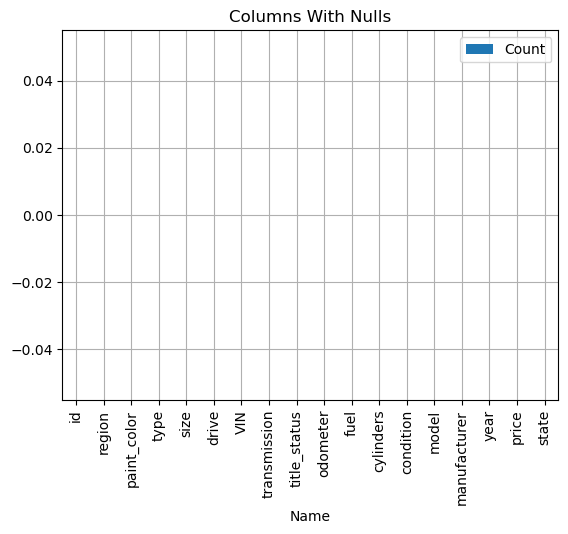

In [7]:
print_nulls_columns(clean_df)

In [8]:
duplicate_count = clean_df.duplicated().value_counts()
print(f"Duplicates: {duplicate_count[0]}/{len(clean_df) }")

Duplicates: 401512/401512


[Text(0.5, 1.0, 'Distribution by Price')]

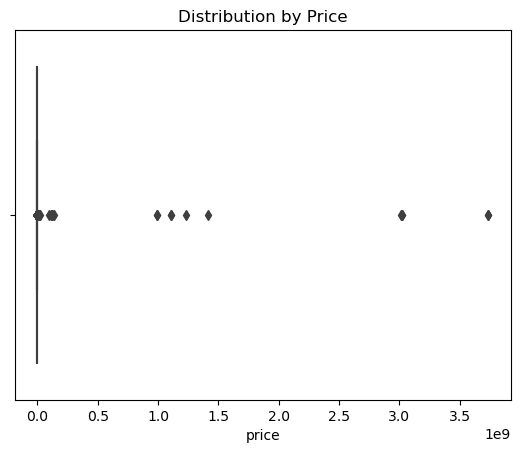

In [9]:
# Check the density of values according to price to find outliers.
sns.boxplot(x=clean_df['price']).set(title = "Distribution by Price")

[Text(0.5, 1.0, 'Distribution by Price')]

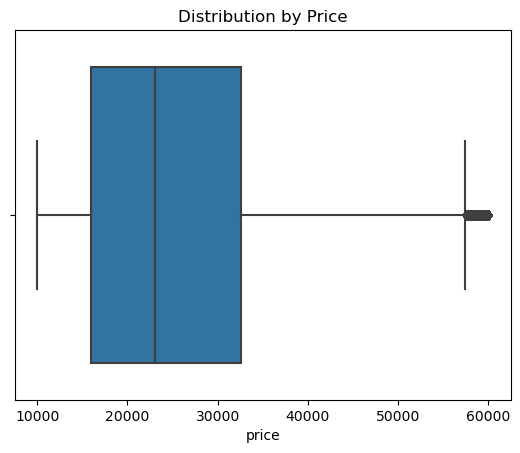

In [10]:
# Lower and upper limits are removed
df_real_prices = clean_df.query("price > 10000 &  price < 60000")
sns.boxplot(x=df_real_prices['price']).set(title = "Distribution by Price")


10000000.0

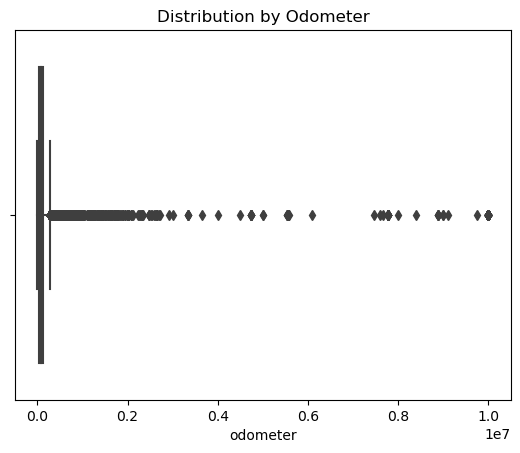

In [11]:
# Check the density of values according to price to find outliers.
sns.boxplot(x=clean_df['odometer']).set(title = "Distribution by Odometer")
clean_df['odometer'].max()

[Text(0.5, 1.0, 'Distribution by odometer')]

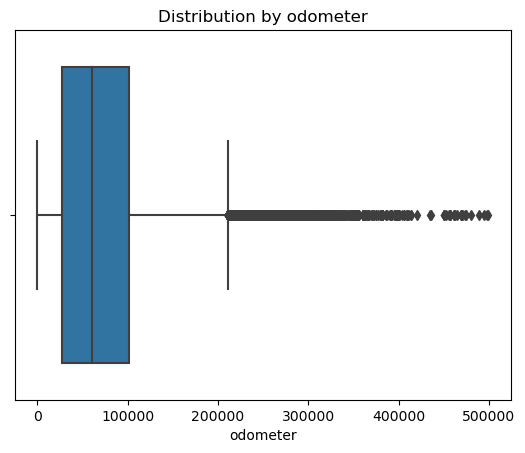

In [12]:
# Lower and upper limits are removed
df_real_prices = df_real_prices.query("odometer < 500000")
sns.boxplot(x=df_real_prices['odometer']).set(title = "Distribution by odometer")

Text(0.5, 1.0, 'Logarithm of Price')

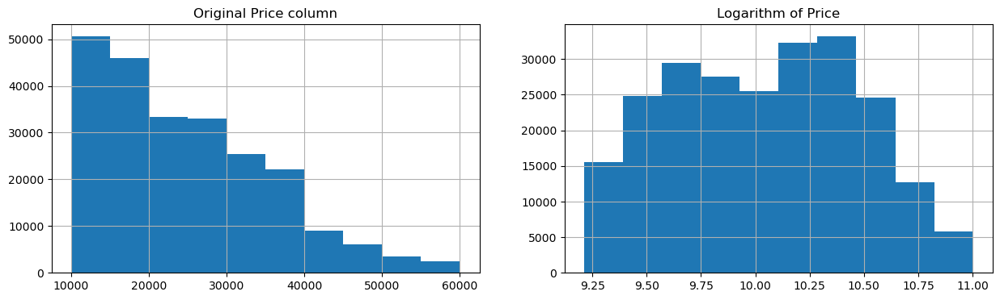

In [13]:
# Price behavior is graphed
fig, ax = plt.subplots(1, 2, figsize = (15, 4))
ax[0].hist(df_real_prices[['price']])
ax[0].grid()
ax[0].set_title('Original Price column')
ax[1].hist(np.log1p(df_real_prices['price']))
ax[1].grid()
ax[1].set_title('Logarithm of Price')

In [14]:
def get_unique_values(df,col):
        col_unique_vals = df[col].unique()
        return col_unique_vals

# This function allows to get unique values per columns
def get_feature_unique_values(values_df):
    colList = values_df.dtypes.reset_index()
    # get the features with object type
    cols = colList
    col_unique_val_counter = []
    for colname in cols["index"]:
        col_unique_vals = get_unique_values(values_df, colname)
        col_unique_val_counter.append([colname, len(col_unique_vals)])

    unique_values = pd.DataFrame(col_unique_val_counter)
    unique_values.columns = ['Name', 'Count']
    unique_values = unique_values.sort_values(by='Count', ascending=False).reset_index()

    unique_values.plot(kind='bar', x='Name', y='Count')
    plt.title('Columns With Unique Values')
    plt.grid()
    plt.show()
    

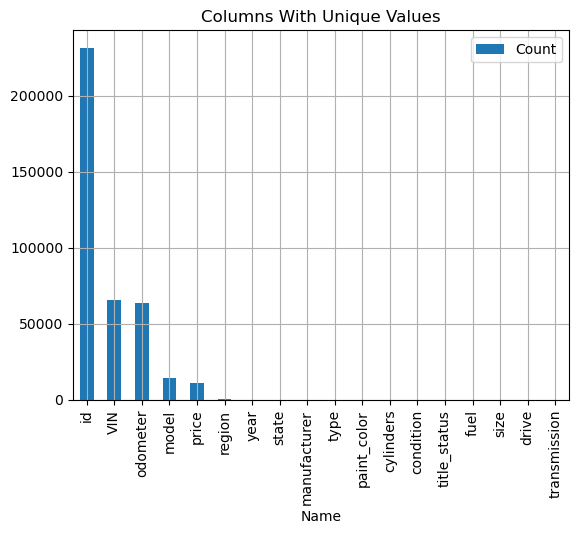

In [15]:
# get unique values of the string features
get_feature_unique_values(df_real_prices)

In [16]:
# Remove unneeded columns
drop_clean_df = df_real_prices.drop(['VIN',  'id', 'region', 'state', 'title_status'], axis = 1)
drop_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 231491 entries, 27 to 426879
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         231491 non-null  int64  
 1   year          231491 non-null  float64
 2   manufacturer  231491 non-null  object 
 3   model         231491 non-null  object 
 4   condition     231491 non-null  object 
 5   cylinders     231491 non-null  object 
 6   fuel          231491 non-null  object 
 7   odometer      231491 non-null  float64
 8   transmission  231491 non-null  object 
 9   drive         231491 non-null  object 
 10  size          231491 non-null  object 
 11  type          231491 non-null  object 
 12  paint_color   231491 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 24.7+ MB


In [17]:
# set incorrect values
print(get_unique_values(drop_clean_df,'condition'))
drop_clean_df['condition'].replace({"0    good" : "good"}, inplace = True)

['good' 'excellent' '0    good' 'like new' 'new' 'fair' 'salvage']


In [18]:
# set incorrect values
print(get_unique_values(drop_clean_df,'cylinders'))
drop_clean_df['cylinders'].replace({"0    6 cylinders" : "6 cylinders"}, inplace = True)

['8 cylinders' '6 cylinders' '0    6 cylinders' '4 cylinders'
 '10 cylinders' 'other' '3 cylinders' '5 cylinders' '12 cylinders']


In [19]:
# set incorrect values
print(get_unique_values(drop_clean_df,'drive'))
drop_clean_df['drive'].replace({"0    4wd" : "4wd"}, inplace = True)

['0    4wd' 'rwd' '4wd' 'fwd']


In [20]:
# set incorrect values
print(get_unique_values(drop_clean_df,'size'))
drop_clean_df['size'].replace({"0    full-size" : "full-size"}, inplace = True)

['0    full-size' 'full-size' 'mid-size' 'compact' 'sub-compact']


In [21]:
# set incorrect values
print(get_unique_values(drop_clean_df,'type'))
drop_clean_df['type'].replace({"0    sedan" : "sedan"}, inplace = True)

['pickup' 'truck' 'other' 'coupe' 'SUV' 'hatchback' 'mini-van' 'sedan'
 '0    sedan' 'offroad' 'convertible' 'wagon' 'van' 'bus']


In [22]:
# set incorrect values
print(get_unique_values(drop_clean_df,'paint_color'))
drop_clean_df['paint_color'].replace({"0    white" : "white"}, inplace = True)

['white' 'blue' 'red' 'black' 'silver' 'grey' '0    white' 'brown'
 'yellow' 'orange' 'green' 'custom' 'purple']


In [23]:
# the categorical columns are encoded and unified to the data base.
cols_categorical = ['manufacturer', 'model', 'condition','cylinders', 'fuel', 'transmission','drive','size','type','paint_color']

target_encoder = TargetEncoder()
df_encoder = target_encoder.fit_transform(drop_clean_df[cols_categorical], drop_clean_df["price"])

df_values = drop_clean_df.drop(cols_categorical, axis=1)
df_values

df_encoder.index = df_values.index
df_values = pd.concat([df_values, df_encoder], axis = 1)

df_values

,price,year,odometer,manufacturer,model,condition,cylinders,fuel,transmission,drive,size,type,paint_color
27,33590,2014.0,57923.0,28823.563324,35224.934489,26408.372889,28260.441784,24004.969879,29128.515235,26919.341441,25743.341999,30253.141828,25813.793722
28,22590,2010.0,71229.0,26141.685351,27447.288957,26408.372889,28260.441784,24004.969879,29128.515235,26919.341441,25743.341999,30253.141828,24202.012397
29,39590,2020.0,19160.0,26141.685351,34451.212302,26408.372889,28260.441784,24004.969879,29128.515235,26919.341441,25743.341999,30253.141828,25178.371311
30,30990,2017.0,41124.0,24538.245056,34749.481707,26408.372889,28260.441784,24004.969879,29128.515235,26919.341441,25743.341999,30253.141828,25178.371311
31,15000,2013.0,128000.0,26503.203627,25616.151515,21287.086044,25746.629020,24004.969879,24002.620778,25728.549929,25743.341999,30147.619662,26162.462236
...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,23590,2019.0,32226.0,20054.861728,24529.545804,26408.372889,25746.629020,24004.969879,29128.515235,19218.244568,25743.341999,22811.715409,25813.793722
426876,30590,2020.0,12029.0,26656.092675,29666.079926,26408.372889,25746.629020,24004.969879,29128.515235,19218.244568,25743.341999,22811.715409,25178.371311
426877,34990,2020.0,4174.0,26308.518365,34566.344086,26408.372889,25746.629020,33512.572384,29128.515235,26919.341441,25743.341999,21144.780370,25813.793722
426878,28990,2018.0,30112.0,24981.515752,24360.333428,26408.372889,25746.629020,24004.969879,29128.515235,19218.244568,25743.341999,22811.715409,23702.459245


[Text(0.5, 1.0, 'Correlations')]

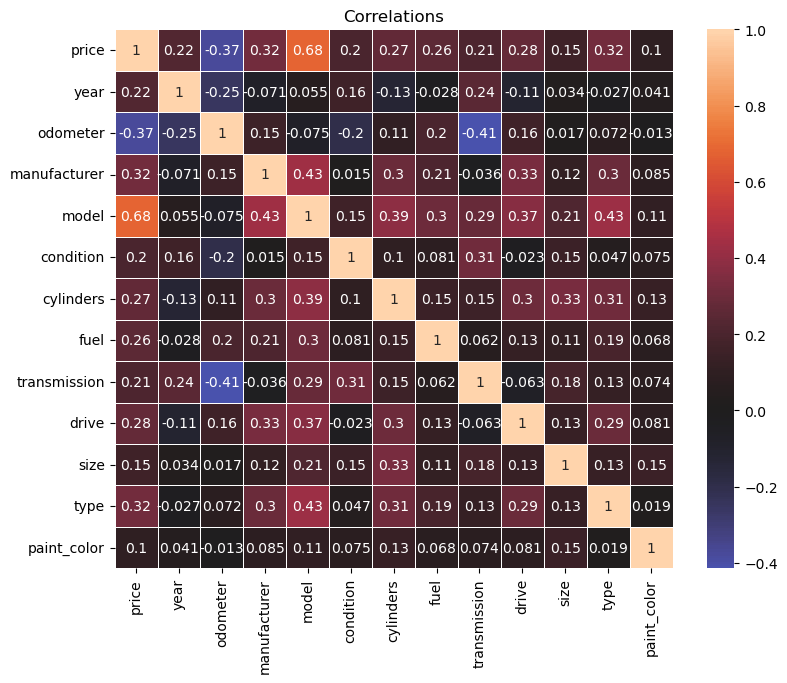

In [24]:
# correlations are plotted
corr_data = df_values.corr()
sns.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots(figsize=(9, 7))

sns.heatmap(corr_data, center = 0, linewidth = .5, annot = True).set(title='Correlations')

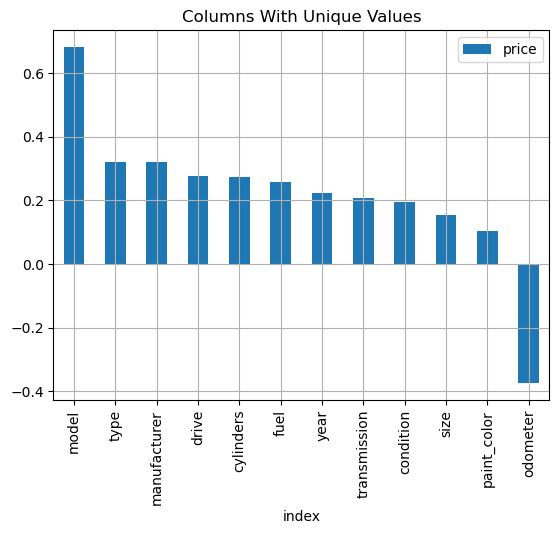

In [25]:
correlaltion_price = corr_data[['price']].sort_values(by='price', ascending=False)[1:].reset_index()
correlaltion_price
correlaltion_price.plot(kind='bar', x='index', y='price')
plt.title('Columns With Unique Values')
plt.grid()
plt.show()

the negative correlation between the odometer and the price can be seen, which indicates that the higher the odometer, the lower the price.

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [26]:
# A logarithmic conversion to the price is made
df_values["price"] = np.log(df_values["price"])

In [27]:
#split data
X = df_values.drop("price", axis=1)
y = df_values["price"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 8)
X_train, X_test, y_train, y_test

(          year  odometer  manufacturer         model     condition  \
 146186  2014.0  103775.0  26503.203627  33310.075110  26408.372889   
 123284  2018.0   36111.0  24538.245056  26184.608608  26408.372889   
 216961  2008.0  190150.0  24538.245056  26879.131394  26408.372889   
 77570   2012.0   72709.0  26656.092675  22827.713857  26408.372889   
 421214  2017.0  185964.0  26503.203627  28909.791922  26408.372889   
 ...        ...       ...           ...           ...           ...   
 258481  2017.0   26566.0  26503.203627  15964.796749  26408.372889   
 114072  2019.0   25067.0  18976.703837  23710.421035  26408.372889   
 273387  2015.0   84633.0  24737.851724  23258.112811  26408.372889   
 46786   2011.0  113123.0  29766.872637  28734.181961  26408.372889   
 127524  2004.0  113000.0  26141.685351  27229.567289  21287.086044   
 
            cylinders          fuel  transmission         drive          size  \
 146186  25746.629020  33512.572384  24002.620778  26919.341441  

In [28]:
# function for plotting the prediction graphs
def plot_prediction (y_test_predict, y_test_real, title):
    plot_df = pd.concat([
        pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1),   columns = ['Pred']), 
        pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
    ])

    pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
    real_df = pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
    plot_df = pd.concat([pred_df, real_df], axis=1)

    display(plot_df)
    fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

    fig.update_layout(
        autosize=False,
        width=1000,
        height=600,
        title=title
    )

    fig.show()

# method of running the model and storing results
results = []
def execute_model (key, train_preds, test_preds):
    train_mse = mean_squared_error(y_train, train_preds)
    test_mse = mean_squared_error(y_test, test_preds)
    train_r2 = r2_score(y_train, train_preds)
    test_r2 = r2_score(y_test, test_preds)

    item = {
        "Key": key, 
        "Train MSE": train_mse, 
        "Test MSE":  test_mse, 
        "Train R2": train_r2, 
        "Test R2":  test_r2
    }
    results.append(item)

    print(item)


### Linear Regresion Simple

In [29]:
#Linear Regression
lin_reg = LinearRegression(fit_intercept = True).fit(X_train, y_train)

lr_train_preds = lin_reg.predict(X_train)
lr_test_preds = lin_reg.predict(X_test)

# Calculate MSE and store the result along the other results
execute_model('Linear Regression', lr_train_preds, lr_test_preds)

{'Key': 'Linear Regression', 'Train MSE': 0.06416739148266809, 'Test MSE': 0.06416720636550641, 'Train R2': 0.6569988198669485, 'Test R2': 0.6587807884846633}


In [30]:
plot = plot_prediction(lr_test_preds, y_test, "Linear Regression")

,Pred,Real
0,9.586688,9.433484
1,9.718203,9.761348
2,9.625296,9.795847
3,10.371621,10.373460
4,10.218635,10.122623
...,...,...
69443,9.638016,9.729134
69444,10.033558,10.203407
69445,9.895705,10.042989
69446,10.003796,10.341581


### Linear Regression with polynomial features

In [31]:
#Linear Regresion With  polinomial
def simple_cross_validation(X_train, y_train, X_test, y_test):
    best_pipe = None
    best_mse = np.inf

    for degree in range(1, 4):
        pipe = Pipeline([
            ("polynomial", PolynomialFeatures(degree = degree, include_bias = False)),
            ("scaler", StandardScaler()),
            ("regression", LinearRegression())
        ])

        pipe.fit(X_train, y_train)
        
        test_mse = mean_squared_error(pipe.predict(X_test), y_test)

        if test_mse < best_mse:
            best_mse = test_mse
            best_pipe = pipe
    return best_pipe

lr_model = simple_cross_validation(X_train, y_train, X_test, y_test)
lr_model.get_params()

{'memory': None,
 'steps': [('polynomial', PolynomialFeatures(degree=3, include_bias=False)),
  ('scaler', StandardScaler()),
  ('regression', LinearRegression())],
 'verbose': False,
 'polynomial': PolynomialFeatures(degree=3, include_bias=False),
 'scaler': StandardScaler(),
 'regression': LinearRegression(),
 'polynomial__degree': 3,
 'polynomial__include_bias': False,
 'polynomial__interaction_only': False,
 'polynomial__order': 'C',
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'regression__copy_X': True,
 'regression__fit_intercept': True,
 'regression__n_jobs': None,
 'regression__positive': False}

In [32]:
p_train_preds = lr_model.predict(X_train)
p_test_preds = lr_model.predict(X_test)

execute_model('Linear Regression With Polynomial', p_train_preds, p_test_preds)

{'Key': 'Linear Regression With Polynomial', 'Train MSE': 0.04397873928791316, 'Test MSE': 0.04447091838455712, 'Train R2': 0.764915494802489, 'Test R2': 0.7635188974862624}


In [33]:
plot = plot_prediction(p_test_preds, y_test, "Linear Regression With Polynomial")

,Pred,Real
0,9.442503,9.433484
1,9.631652,9.761348
2,9.553224,9.795847
3,10.442233,10.373460
4,10.147401,10.122623
...,...,...
69443,9.644042,9.729134
69444,9.974631,10.203407
69445,9.892367,10.042989
69446,9.973495,10.341581


### Ridge

In [34]:
def simple_cross_validation_ridge(X_train, y_train, X_test, y_test):
    best_pipe = None
    best_mse = np.inf

    for degree in range(1, 4):
        pipe = Pipeline([
            ("polynomial", PolynomialFeatures(degree = degree, include_bias = False)),
            ("scaler", StandardScaler()),
            ('ridge', Ridge())
        ])

        pipe.fit(X_train, y_train)
        
        test_mse = mean_squared_error(pipe.predict(X_test), y_test)

        if test_mse < best_mse:
            best_mse = test_mse
            best_pipe = pipe
    return best_pipe

lr_ridge_model = simple_cross_validation_ridge(X_train, y_train, X_test, y_test)
lr_ridge_model.get_params()

{'memory': None,
 'steps': [('polynomial', PolynomialFeatures(degree=3, include_bias=False)),
  ('scaler', StandardScaler()),
  ('ridge', Ridge())],
 'verbose': False,
 'polynomial': PolynomialFeatures(degree=3, include_bias=False),
 'scaler': StandardScaler(),
 'ridge': Ridge(),
 'polynomial__degree': 3,
 'polynomial__include_bias': False,
 'polynomial__interaction_only': False,
 'polynomial__order': 'C',
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'ridge__alpha': 1.0,
 'ridge__copy_X': True,
 'ridge__fit_intercept': True,
 'ridge__max_iter': None,
 'ridge__positive': False,
 'ridge__random_state': None,
 'ridge__solver': 'auto',
 'ridge__tol': 0.0001}

In [35]:
ridge_train_preds = lr_ridge_model.predict(X_train)
ridge_test_preds = lr_ridge_model.predict(X_test)

execute_model('Linear Regression With Ridge', ridge_train_preds, ridge_test_preds)

{'Key': 'Linear Regression With Ridge', 'Train MSE': 0.04869846967919495, 'Test MSE': 0.04930280775179369, 'Train R2': 0.7396865887068322, 'Test R2': 0.7378245658579481}


In [36]:
plot = plot_prediction(ridge_test_preds, y_test, "Linear Regression With Ridge")

,Pred,Real
0,9.474791,9.433484
1,9.677602,9.761348
2,9.635883,9.795847
3,10.446232,10.373460
4,10.213577,10.122623
...,...,...
69443,9.657459,9.729134
69444,9.962505,10.203407
69445,9.924850,10.042989
69446,9.996959,10.341581


###  Lasso

In [37]:
pipe = Pipeline([
    ('selector', SequentialFeatureSelector(Lasso())),
    ('lasso', Lasso())
])
pipe.fit(X_train, y_train)

lasso_train_preds = pipe.predict(X_train)
lasso_test_preds = pipe.predict(X_test)

#best_features = pipe.named_steps['lasso'].transform(X)
#best_features_df = pd.DataFrame(best_features, columns = pipe.named_steps['lasso'].get_feature_names_out())

pipe
execute_model('Lasso', lasso_train_preds, lasso_test_preds)

#best_features_df

{'Key': 'Lasso', 'Train MSE': 0.07033966051800206, 'Test MSE': 0.07016474034010842, 'Train R2': 0.6240054954649417, 'Test R2': 0.626887958334117}


In [38]:
plot = plot_prediction(lasso_test_preds, y_test, "Lasso")


,Pred,Real
0,9.654231,9.433484
1,9.661334,9.761348
2,9.603633,9.795847
3,10.247841,10.373460
4,10.164964,10.122623
...,...,...
69443,9.616748,9.729134
69444,10.013075,10.203407
69445,9.869552,10.042989
69446,9.988905,10.341581


### RFE & Lasso

In [39]:
pipe = Pipeline([
     ('rfe', RFE(Lasso())),
     ("scaler", StandardScaler()),
     ('linreg', LinearRegression())
])

pipe.fit(X_train, y_train)

rfe_train_preds = pipe.predict(X_train)
rfe_test_preds = pipe.predict(X_test)

best_features = pipe.named_steps['rfe'].transform(X)
best_features_df = pd.DataFrame(best_features, columns = pipe.named_steps['rfe'].get_feature_names_out())

execute_model('RFE', rfe_train_preds, rfe_test_preds)
best_features_df.head()

{'Key': 'RFE', 'Train MSE': 0.09836661344202391, 'Test MSE': 0.09935143876585147, 'Train R2': 0.4741898693915402, 'Test R2': 0.4716830992221339}


,model,condition,fuel,transmission,drive,paint_color
0,35224.934489,26408.372889,24004.969879,29128.515235,26919.341441,25813.793722
1,27447.288957,26408.372889,24004.969879,29128.515235,26919.341441,24202.012397
2,34451.212302,26408.372889,24004.969879,29128.515235,26919.341441,25178.371311
3,34749.481707,26408.372889,24004.969879,29128.515235,26919.341441,25178.371311
4,25616.151515,21287.086044,24004.969879,24002.620778,25728.549929,26162.462236


In [40]:
plot = plot_prediction(rfe_test_preds, y_test, "RFE")

,Pred,Real
0,9.961758,9.433484
1,9.566065,9.761348
2,9.657670,9.795847
3,10.091437,10.373460
4,10.132291,10.122623
...,...,...
69443,9.668700,9.729134
69444,9.721481,10.203407
69445,9.870676,10.042989
69446,9.986084,10.341581


### GridSearchCV

In [41]:
#Ridge with gridSearch
alphas = {"ridge__alpha" : [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0]}
ridge_pipe = Pipeline([
    ("transform", PolynomialFeatures(degree = 3, include_bias = False)),
    ("scale", StandardScaler()),
    ("ridge", Ridge())
])

#GridSearchCV to find optimal alpha hyperparameter 
ridge_grid = GridSearchCV(estimator = ridge_pipe,
                            param_grid = alphas,
                            scoring = "neg_mean_squared_error",
                            cv = 3)   

In [42]:
ridge_grid.fit(X_train, y_train) 

best_estimator = ridge_grid.best_estimator_
best_model = best_estimator.named_steps['ridge']

grid_train_preds = pipe.predict(X_train)
grid_test_preds = pipe.predict(X_test)

execute_model('Ridge + GridSearchCV', grid_train_preds, grid_test_preds)
best_estimator, best_model

{'Key': 'Ridge + GridSearchCV', 'Train MSE': 0.09836661344202391, 'Test MSE': 0.09935143876585147, 'Train R2': 0.4741898693915402, 'Test R2': 0.4716830992221339}


(Pipeline(steps=[('transform', PolynomialFeatures(degree=3, include_bias=False)),
                 ('scale', StandardScaler()), ('ridge', Ridge(alpha=0.0001))]),
 Ridge(alpha=0.0001))

In [43]:
plot = plot_prediction(grid_test_preds, y_test, "Ridge + GridSearchCV")

,Pred,Real
0,9.961758,9.433484
1,9.566065,9.761348
2,9.657670,9.795847
3,10.091437,10.373460
4,10.132291,10.122623
...,...,...
69443,9.668700,9.729134
69444,9.721481,10.203407
69445,9.870676,10.042989
69446,9.986084,10.341581


### Results of Models

In [44]:
results_df = pd.DataFrame(results)
results_df.sort_values(by='Test MSE')

,Key,Train MSE,Test MSE,Train R2,Test R2
1,Linear Regression With Polynomial,0.043979,0.044471,0.764915,0.763519
2,Linear Regression With Ridge,0.048698,0.049303,0.739687,0.737825
0,Linear Regression,0.064167,0.064167,0.656999,0.658781
3,Lasso,0.070340,0.070165,0.624005,0.626888
4,RFE,0.098367,0.099351,0.474190,0.471683
5,Ridge + GridSearchCV,0.098367,0.099351,0.474190,0.471683


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

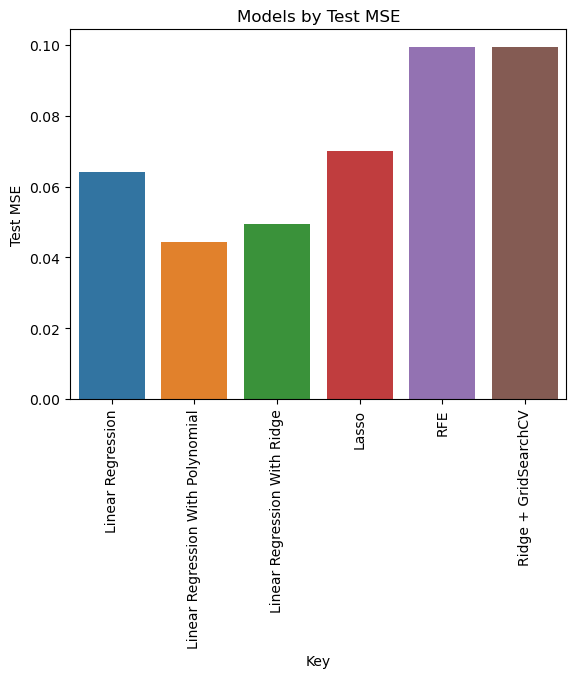

In [45]:
#plt.figure(figsize = (8, 8))
fig = sns.barplot(data = results_df, x = 'Key', y = 'Test MSE')
plt.xticks(rotation=90)
plt.title("Models by Test MSE")
plt.show()

It can be seen that the best mse for all the models was linear regression with polynomial

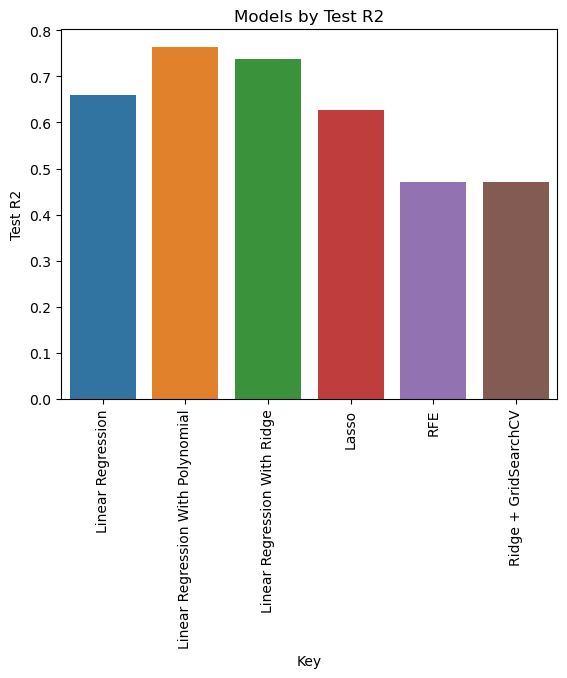

In [46]:
fig = sns.barplot(data = results_df, x = 'Key', y = 'Test R2')
plt.xticks(rotation=90)
plt.title("Models by Test R2")
plt.show()

The highest R2 also for this is that of linear regression with polynomial

In [47]:
importances_tr = permutation_importance(lr_model, X_test, y_test, n_repeats = 30, random_state=20)
display(importances_tr)

{'importances_mean': array([0.29649202, 0.21467232, 0.03098748, 0.44734756, 0.00697451,
        0.06569523, 0.06523759, 0.04911745, 0.03423224, 0.00626121,
        0.01569834, 0.00178128]),
 'importances_std': array([0.0027792 , 0.00169412, 0.00069133, 0.00272236, 0.00018176,
        0.0008996 , 0.00084094, 0.00076608, 0.00056882, 0.00026415,
        0.00040334, 0.00019605]),
 'importances': array([[0.30039946, 0.29818515, 0.29846277, 0.2926531 , 0.29654535,
         0.2949125 , 0.29599234, 0.29445894, 0.29684061, 0.29409902,
         0.29587754, 0.29418439, 0.29570585, 0.30209593, 0.29605855,
         0.29670114, 0.30094541, 0.29531576, 0.30039124, 0.29364907,
         0.29635884, 0.29466167, 0.29601417, 0.30213233, 0.2983548 ,
         0.29406134, 0.29387477, 0.29028865, 0.29955744, 0.29598249],
        [0.21416332, 0.21661327, 0.2148647 , 0.21398025, 0.21572163,
         0.21666183, 0.21191432, 0.21190482, 0.21455008, 0.21518399,
         0.21677972, 0.21330808, 0.21229359, 0.215085

In [48]:
for i in importances_tr.importances_mean.argsort()[::-1]:
    if importances_tr.importances_mean[i] - 2 * importances_tr.importances_std[i] > 0:
        print(f"{list(X_test.columns)[i]:<8} "
            f"{importances_tr.importances_mean[i]:.3f}"
            f" +/- {importances_tr.importances_std[i]:.3f}")


model    0.447 +/- 0.003
year     0.296 +/- 0.003
odometer 0.215 +/- 0.002
cylinders 0.066 +/- 0.001
fuel     0.065 +/- 0.001
transmission 0.049 +/- 0.001
drive    0.034 +/- 0.001
manufacturer 0.031 +/- 0.001
type     0.016 +/- 0.000
condition 0.007 +/- 0.000
size     0.006 +/- 0.000
paint_color 0.002 +/- 0.000


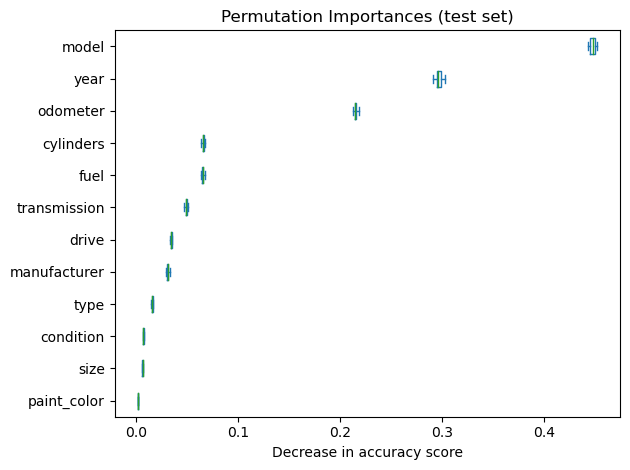

In [49]:
sorted_importances_idx = importances_tr.importances_mean.argsort()
importances = pd.DataFrame(
    importances_tr.importances[sorted_importances_idx].T,
    columns=X_test.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (test set)")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

{'year': 0.29649202095849925,
 'odometer': 0.21467231673146478,
 'manufacturer': 0.030987484113644517,
 'model': 0.44734755529867115,
 'condition': 0.006974510214751987,
 'cylinders': 0.06569523103904645,
 'fuel': 0.0652375943684919,
 'transmission': 0.049117446811429516,
 'drive': 0.034232237537842505,
 'size': 0.00626120955172486,
 'type': 0.015698343508355184,
 'paint_color': 0.0017812839592601085}

{'model': 0.44734755529867115,
 'year': 0.29649202095849925,
 'odometer': 0.21467231673146478,
 'cylinders': 0.06569523103904645,
 'fuel': 0.0652375943684919,
 'transmission': 0.049117446811429516,
 'drive': 0.034232237537842505,
 'manufacturer': 0.030987484113644517,
 'type': 0.015698343508355184,
 'condition': 0.006974510214751987,
 'size': 0.00626120955172486,
 'paint_color': 0.0017812839592601085}

,Importances
model,0.447348
year,0.296492
odometer,0.214672
cylinders,0.065695
fuel,0.065238
transmission,0.049117
drive,0.034232
manufacturer,0.030987
type,0.015698
condition,0.006975


<Axes: xlabel='Importances'>

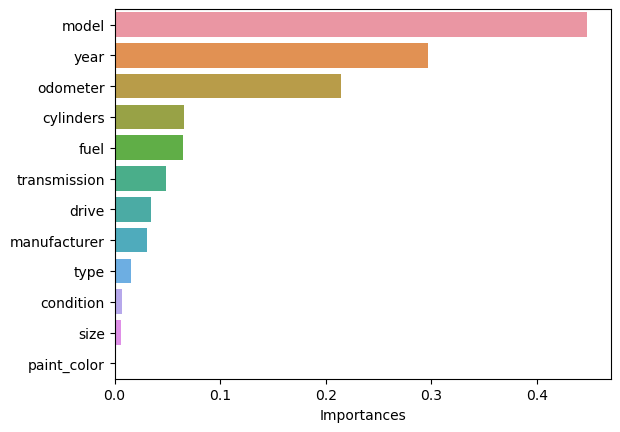

In [50]:
importances_tb = dict(zip(X_test.columns, importances_tr.importances_mean))
display(importances_tb)
importances_tb = {k : v for k ,v in sorted(importances_tb.items(), key = lambda x: x[1], reverse = True)}
display(importances_tb)

import_df = pd.DataFrame(importances_tb.values(), index=importances_tb.keys(), columns = ['Importances'])
display(import_df)

sns.barplot(x = import_df['Importances'], y = import_df.index)

In the permutation importance analysis it can be seen that the most important characteristics are Model, Year, Odometer and Cylinders.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

After knowing the information provided, we proceeded to analyze the information by adjusting different models to find the closest in predictions, and thus be able to find the correlative values that allow us to find which are the properties that make a car more or less expensive.

One of the important factors was to remove outliers that could divert our attention and generate high errors in our analysis.

#### Feature: Model 
for the model we chose the first 15 most expensive records and the 15 cheapest records and we can see that there are quite exclusive models in the 59999 range.

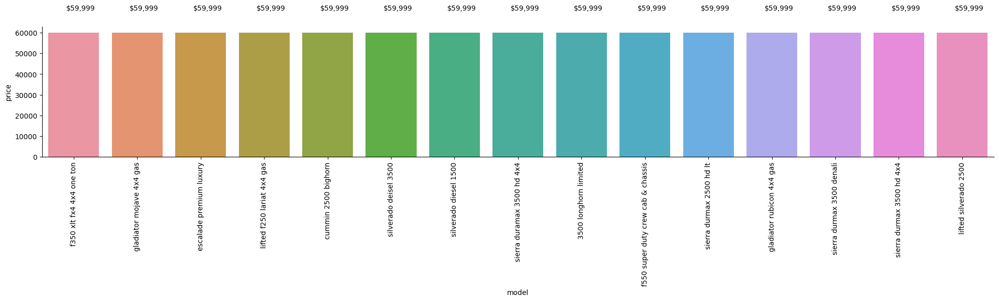

In [51]:
plot_data = drop_clean_df.groupby(['model'])['price'].mean().reset_index()
plot_data =  plot_data.sort_values(by='price', ascending=False)

plt.figure(figsize=(20, 6))
ax = sns.barplot(data=plot_data[:15], x='model', y='price')
sns.despine()

for p in ax.patches:
    ax.annotate('${:,.0f}'.format(p.get_height()),
    (p.get_x() + p.get_width() / 2., p.get_height()+0.1),
    ha = 'center', va = 'top',
    xytext = (10, 40),
    textcoords = 'offset points',
    rotation=0)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

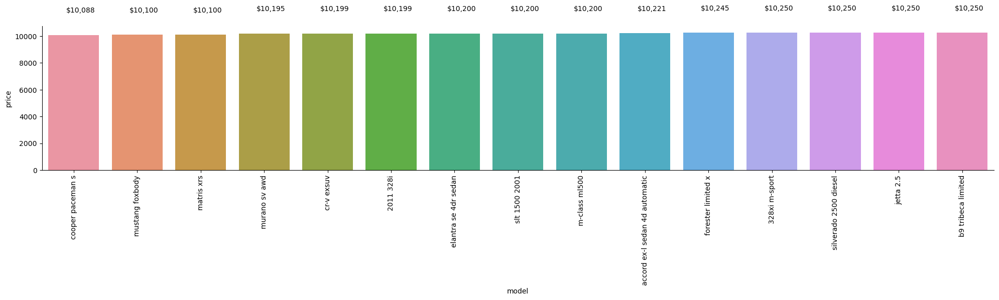

In [52]:
plot_data = drop_clean_df.groupby(['model'])['price'].mean().reset_index()
plot_data =  plot_data.sort_values(by='price', ascending=True)

plt.figure(figsize=(20, 6))
ax = sns.barplot(data=plot_data[:15], x='model', y='price')
sns.despine()

for p in ax.patches:
    ax.annotate('${:,.0f}'.format(p.get_height()),
    (p.get_x() + p.get_width() / 2., p.get_height()+0.1),
    ha = 'center', va = 'top',
    xytext = (10, 40),
    textcoords = 'offset points',
    rotation=0)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Feature: Year
The characteristic year, you can see a behavior of the average value according to the year depending on what happened in different periods of time.
We can also see the influence of the classic cars in the value, and the valuation of the last ones that has happened in the last years. 

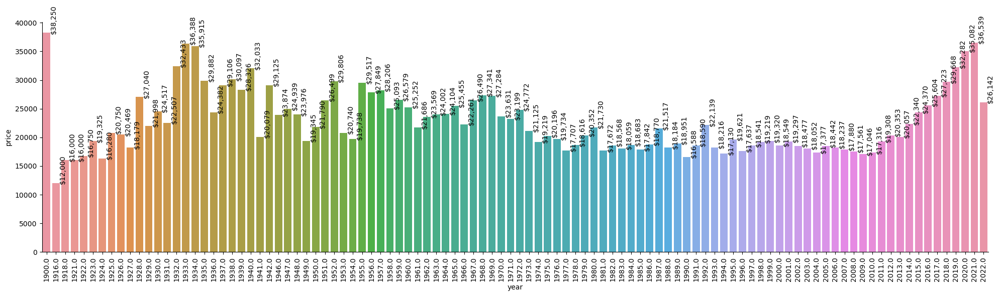

In [53]:
plot_data = drop_clean_df.groupby('year')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)

plt.figure(figsize=(20, 6))
ax = sns.barplot(data=plot_data, x='year', y='price')
sns.despine()

for p in ax.patches:
    ax.annotate('${:,.0f}'.format(p.get_height()),
    (p.get_x() + p.get_width() / 2., p.get_height()+0.1),
    ha = 'center', va = 'top',
    xytext = (10, 40),
    textcoords = 'offset points',
    rotation=90)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Feature: Cylinders
the cylinders influence the price the more cylinders have a higher value except for 8 and 6 which are the majority of engines of luxury vehicles.

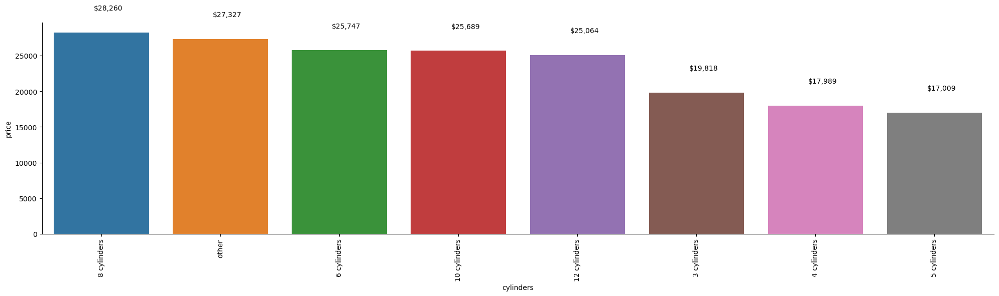

In [54]:
plot_data = drop_clean_df.groupby(['cylinders'])['price'].mean().reset_index()
plot_data =  plot_data.sort_values(by='price', ascending=False)

plt.figure(figsize=(20, 6))
ax = sns.barplot(data=plot_data, x='cylinders', y='price')
sns.despine()

for p in ax.patches:
    ax.annotate('${:,.0f}'.format(p.get_height()),
    (p.get_x() + p.get_width() / 2., p.get_height()+0.1),
    ha = 'center', va = 'top',
    xytext = (10, 40),
    textcoords = 'offset points',
    rotation=0)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Feature: Odometer
the odometer influences the price because according to the concept of used cars when an odometer has more than 100,000 miles it generates maintenance that generates an additional cost after the purchase, which lowers the value of the used vehicle.

#### conclusions

It can be said that the model, year and odometer significantly influence the behavior of the price, more exclusive and recent models cause the price to increase drastically, while previous years cause the price to decrease except in cars that are very old or called collectors, also when the car has miles greater than 100,000 it generates a drop in its values

### Next Steps
1. Deepen the search for new models to try to find better models.
2. Categorize the odometers in order to be able to see the behavior of this grouping in the analysis.
3. Running models without excluding all information

### Recomendations
1. Test models with all dataset information
2. Categorize and unify models and brands to find patterns that indicate pricing influence